In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python

import tensorflow as tf
import matplotlib.pyplot as plt
import IPython.display as display
from PIL import Image
import numpy as np 
import pandas as pd
import os, random
import pathlib

**Dataset Preprocessing**

In [2]:
train_dir = pathlib.Path('../input/mossignatures/TrainingSet')
img_count = len(list(train_dir.glob('*/*/*.png')))

CLASSNAMES = [item.name + '-' + str(item.parent.name) for item in train_dir.glob('*/*')]
LABELS = tf.convert_to_tensor(tf.constant(CLASSNAMES))
BATCH_SIZE = 32
IMG_HEIGHT = 128
IMG_WIDTH = 128
CHANNELS = 3
EPOCHS = 64
CACHE = True
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [3]:
def get_label(file_path):
    parts = tf.strings.split(file_path, os.path.sep)
    label = parts[-2]+'-'+parts[-3]  # label is a string
    indx = tf.where(tf.equal(label,LABELS)) # get corresponding integer for label
    indx = tf.cast(indx, tf.float32)
    return indx

def decode_img(img):
    img = tf.image.decode_png(img, channels=3)
    #img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, [IMG_WIDTH, IMG_HEIGHT])
    return img/255.0

def process_path(file_path):
    label = get_label(file_path)
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img, label

def train_data_loader(ds, cache=CACHE, shuffle_buffer_size=2000):
    if cache:
        if isinstance(cache, str):
            ds = ds.cache(cache)
        else:
            ds = ds.cache()
    ds = ds.shuffle(buffer_size=shuffle_buffer_size)
    #ds = ds.repeat(EPOCHS)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

list_ds = tf.data.Dataset.list_files(str(train_dir/'*/*/*'))
ds = list_ds.map(process_path, num_parallel_calls=AUTOTUNE)
train_gen = train_data_loader(ds)


In [4]:
params = {
    'margin': 1.0,
    'squared': False,
    'learning_rate': 1e-3,
    'momentum': 0.9,
    'batch_size': 32,
    'epochs': 64,
    'embedding_size': 64
}

**Triplet loss**

In [5]:

# Compute the 2D matrix of distances between all the embeddings.
def _pairwise_distances(embeddings, squared=False):
    dot_product = tf.linalg.matmul(embeddings, tf.transpose(embeddings))
    square_norm = tf.linalg.diag_part(dot_product)
    # Compute the pairwise distance matrix as we have:
    distances = tf.expand_dims(square_norm, 1) - 2.0 * dot_product + tf.expand_dims(square_norm, 0)
    distances = tf.math.maximum(distances, 0.0)
    if not squared:
        mask = tf.cast(tf.equal(distances, 0.0), tf.float32)
        distances = distances + mask * 1e-16
        distances = tf.math.sqrt(distances)
        distances = distances * (1.0 - mask)
    return distances



In [6]:
#!pip install tensorflow_addons==0.9.1
import tensorflow_addons as tfa

def _masked_minimum(data, mask, dim=1):
    """Computes the axis wise minimum over chosen elements.
    Args:
      data: 2-D float `Tensor` of size [n, m].
      mask: 2-D Boolean `Tensor` of size [n, m].
      dim: The dimension over which to compute the minimum.
    Returns:
      masked_minimums: N-D `Tensor`.
        The minimized dimension is of size 1 after the operation.
    """
    axis_maximums = tf.math.reduce_max(data, dim, keepdims=True)
    masked_minimums = (
        tf.math.reduce_min(
            tf.math.multiply(data - axis_maximums, mask), dim, keepdims=True
        )
        + axis_maximums
    )
    return masked_minimums

def _masked_maximum(data, mask, dim=1):
    """Computes the axis wise maximum over chosen elements.
    Args:
      data: 2-D float `Tensor` of size [n, m].
      mask: 2-D Boolean `Tensor` of size [n, m].
      dim: The dimension over which to compute the maximum.
    Returns:
      masked_maximums: N-D `Tensor`.
        The maximized dimension is of size 1 after the operation.
    """
    axis_minimums = tf.math.reduce_min(data, dim, keepdims=True)
    masked_maximums = (
        tf.math.reduce_max(
            tf.math.multiply(data - axis_minimums, mask), dim, keepdims=True
        )
        + axis_minimums
    )
    return masked_maximums

#@tf.keras.utils.register_keras_serializable(package='Custom')
@tf.function
def t_loss(y_true, y_pred, margin=params['margin']):
    labels, embeddings = y_true, y_pred
    # Reshape label tensor to [batch_size, 1].
    lshape = tf.shape(labels)
    labels = tf.reshape(labels, [lshape[0], 1])

    # Build pairwise squared distance matrix.
    pdist_matrix = tfa.losses.metric_learning.pairwise_distance(embeddings, squared=True)
    #pdist_matrix = _pairwise_distances(embeddings, squared=True)
    # Build pairwise binary adjacency matrix.
    adjacency = tf.math.equal(labels, tf.transpose(labels))
    # Invert so we can select negatives only.
    adjacency_not = tf.math.logical_not(adjacency)

    adjacency_not = tf.cast(adjacency_not, dtype=tf.dtypes.float32)
    # hard negatives: smallest D_an.
    hard_negatives = _masked_minimum(pdist_matrix, adjacency_not)

    batch_size = tf.size(labels)

    adjacency = tf.cast(adjacency, dtype=tf.dtypes.float32)

    mask_positives = tf.cast(adjacency, dtype=tf.dtypes.float32) - tf.linalg.diag(
        tf.ones([batch_size])
    )

    # hard positives: largest D_ap.
    hard_positives = _masked_maximum(pdist_matrix, mask_positives)

    triplet_loss = tf.maximum(hard_positives - hard_negatives + margin, 0.0)

    # Get final mean triplet loss
    triplet_loss = tf.reduce_mean(triplet_loss)

    return triplet_loss

#@tf.keras.utils.register_keras_serializable(package='Custom')
class TripletHardLoss(tf.keras.losses.Loss):
    """Computes the triplet loss with hard negative and hard positive mining.
    The loss encourages the maximum positive distance (between a pair of embeddings
    with the same labels) to be smaller than the minimum negative distance plus the
    margin constant in the mini-batch.
    The loss selects the hardest positive and the hardest negative samples
    within the batch when forming the triplets for computing the loss.
    See: https://arxiv.org/pdf/1703.07737.
    We expect labels `y_true` to be provided as 1-D integer `Tensor` with shape
    [batch_size] of multi-class integer labels. And embeddings `y_pred` must be
    2-D float `Tensor` of l2 normalized embedding vectors.
    Args:
      margin: Float, margin term in the loss definition. Default value is 1.0.
      name: Optional name for the op.
    """

    def __init__(
        self,
        margin = 1.0,
        name = None,
        **kwargs
    ):
        super().__init__(name=name, reduction=tf.keras.losses.Reduction.NONE)
        self.margin = margin

    def call(self, y_true, y_pred):
        return t_loss(y_true, y_pred, self.margin)

    def get_config(self):
        config = { "margin": self.margin }
        base_config = super().get_config()
        return {**base_config, **config}

**Model Function**

In [7]:
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import ResNet50
    
def createModel(emb_size=params['embedding_size']):
    base_model = ResNet50(input_shape=(IMG_HEIGHT,IMG_WIDTH,CHANNELS),
                                   pooling='max', include_top=False)
    mossnet = Sequential()
    mossnet.add(base_model)
    mossnet.add(Dense(emb_size))
    mossnet.add(Lambda(lambda x : tf.math.l2_normalize(x,axis=1), name='t_emb_1_l2norm'))
    return mossnet

mossnet = createModel()
mossnet.summary()



94773248/94765736 [==============================] - 2s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 2048)              23587712  
_________________________________________________________________
dense (Dense)                (None, 64)                131136    
_________________________________________________________________
t_emb_1_l2norm (Lambda)      (None, 64)                0         
Total params: 23,718,848
Trainable params: 23,665,728
Non-trainable params: 53,120
_________________________________________________________________


**Training**

In [8]:
checkpoint_path = "training_1/cp.ckpt"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path)

mossnet.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=params['learning_rate']),
               loss=TripletHardLoss(margin=1.0))

learning = mossnet.fit(train_gen, epochs=EPOCHS, callbacks=[checkpoint_callback])

Epoch 1/64
61/61 [==============================] - 39s 646ms/step - loss: 0.2949
Epoch 2/64
61/61 [==============================] - 38s 620ms/step - loss: 0.2590
Epoch 3/64
61/61 [==============================] - 39s 644ms/step - loss: 0.2430
Epoch 4/64
61/61 [==============================] - 41s 670ms/step - loss: 0.2245
Epoch 10/64
61/61 [==============================] - 40s 660ms/step - loss: 0.2003
Epoch 11/64
61/61 [==============================] - 41s 665ms/step - loss: 0.2270
Epoch 12/64
61/61 [==============================] - 41s 673ms/step - loss: 0.2130
Epoch 13/64
61/61 [==============================] - 41s 671ms/step - loss: 0.2000
Epoch 14/64
61/61 [==============================] - 40s 659ms/step - loss: 0.1920
Epoch 15/64
61/61 [==============================] - 41s 677ms/step - loss: 0.1804
Epoch 16/64
61/61 [==============================] - 42s 688ms/step - loss: 0.1921
Epoch 17/64
61/61 [==============================] - 41s 668ms/step - loss: 0.1646
Epoch 18

In [9]:
#del MOSSNET
!mkdir -p saved_model
mossnet.save('saved_model/MOSSNET')
#loadel_model = tf.keras.models.load_model('saved_model/MOSSNET', custom_objects={'t_loss': TripletHardLoss(margin=params['margin'])})
trained_model = tf.keras.models.load_model("saved_model/MOSSNET", compile=False)

In [10]:
ref_dir = pathlib.Path('../input/mossignatures/TestSet/References')
pos_dir = pathlib.Path('../input/mossignatures/TestSet/Queries/genuine')
neg_dir = pathlib.Path('../input/mossignatures/TestSet/Queries/forged')

ref_gen = ref_dir.glob('**/*1.png')
refs = [str(i) for i in ref_gen]

pos_gen = pos_dir.glob('**/*.png')
pos = [str(i) for i in pos_gen]
                       
neg_gen = neg_dir.glob('**/*.png')
negs = [str(i) for i in neg_gen]

In [11]:
def get_images(path):
    img = tf.io.read_file(path)
    img = decode_img(img)
    return img

def evaluate_model(TP,TN,FP,FN):
    recall = TP / (TP + FN)         # determine the recall        
    precision = TP / (TP + FP)      #determine the precision
    f1_score = 2.0 * (recall * precision) / (recall + precision)  # determine the f1-score      
    far = FP / (FP + TN)            # determine the false acceptance rate        
    frr = FN / (FN + TP)            # determine the false rejection rate        
    eer = (far + frr) / 2.0         # determine the equal error rate        
    acc = 1.0 - eer                 # lastly the accuracy
    return {        
        "recall" : recall,       
        "precision" : precision,         
        "f1-score" : f1_score,     
        "far" : far,        
        "frr" : frr,        
        "eer" : eer,        
        "acc" : acc,
    }

references = map(get_images, refs)
p_queries = map(get_images, pos)
n_queries = map(get_images, negs)


r = [i for i in references]
p = [i for i in p_queries]
n = [i for i in n_queries]


In [12]:
threshold = tf.constant([1.0])


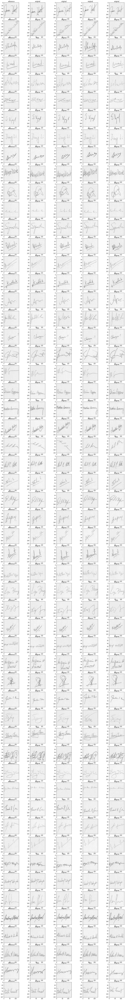

In [13]:
TP, FN = 0, 0

plt.figure(figsize=(20,160))
for i, reference in enumerate(r):
    reference = tf.reshape(reference, shape=[1, 128, 128, 3])
    anchor = mossnet(reference)
    plt.subplot(55,5,i*5+1)
    plt.imshow(tf.squeeze(reference))
    plt.title('reference')
    index, k = [i*4, i*4+1, i*4+2, i*4+3], 2
    for query in tf.gather(p, index):
        query = tf.reshape(query, shape=[1, 128, 128, 3])
        test = mossnet(query)
        pdist_matrix = _pairwise_distances(tf.concat([anchor,test],0))
        pairwise_distance = tf.slice(pdist_matrix, [0,1], [1,1])
        pairwise_distance = tf.reshape(pairwise_distance, [1])
        #print('\t{}'.format(pairwise_distance))
        plt.subplot(55,5,i*5+k)
        plt.imshow(tf.squeeze(query))
        if tf.math.less_equal(pairwise_distance,threshold):
            TP += 1
            plt.title('original')
        else:
            FN += 1
            plt.title('fake')
        k+=1
        
plt.show()        
            

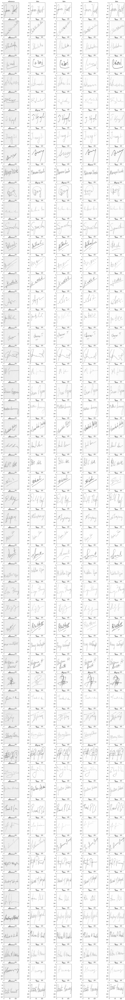

In [14]:
TN, FP = 0, 0
tn_array, fp_array = [], []

plt.figure(figsize=(20,160))
for i, reference in enumerate(r):
    reference = tf.reshape(reference, shape=[1, 128, 128, 3])
    anchor = mossnet(reference)
    plt.subplot(55,5,i*5+1)
    plt.imshow(tf.squeeze(reference))
    plt.title('reference')
    index, k = [i*4, i*4+1, i*4+2, i*4+3], 2
    for query in tf.gather(n, index):
        query = tf.reshape(query, shape=[1, 128, 128, 3])
        test = mossnet(query)
        pdist_matrix = _pairwise_distances(tf.concat([anchor,test],0))
        pairwise_distance = tf.slice(pdist_matrix, [0,1], [1,1])
        pairwise_distance = tf.reshape(pairwise_distance, [1])
        #print('\t{}'.format(pairwise_distance))
        plt.subplot(55,5,i*5+k)
        plt.imshow(tf.squeeze(query))
        if tf.math.greater(pairwise_distance,threshold):
            TN += 1
            plt.title('fake')
        else:
            FP += 1
            plt.title('original')
        k+=1
        
plt.show()  
            


In [15]:
print('TP: {}\nFN: {}'.format(TP,FN))
print('TN: {}\nFP: {}'.format(TN,FP))
print(evaluate_model(TP,TN,FP,FN))

TP: 184
FN: 36
TN: 210
FP: 10
{'recall': 0.8363636363636363, 'precision': 0.9484536082474226, 'f1-score': 0.8888888888888888, 'far': 0.045454545454545456, 'frr': 0.16363636363636364, 'eer': 0.10454545454545455, 'acc': 0.8954545454545455}
